In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import missingno as msno
import seaborn as sns
import warnings
import math
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PowerTransformer, LabelEncoder
from sklearn.model_selection import (cross_val_score, train_test_split, learning_curve, 
                                     GridSearchCV, RandomizedSearchCV, validation_curve)
from scipy.stats import loguniform, uniform, randint
from sklearn.impute import SimpleImputer
from sklearn.datasets import load_breast_cancer, load_wine, load_digits
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                            roc_auc_score, classification_report, confusion_matrix, roc_curve)
from sklearn.ensemble import RandomForestClassifier
import warnings

In [2]:
warnings.filterwarnings("ignore")

In [4]:
df = pd.read_csv('../data/train_mobile_price.csv')
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [7]:
# df = df.rename(columns={'':'', 
                      # })

#df.columns = ['',]
#df

In [5]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [11]:
# df = pd.get_dummies(df, drop_first=False, dtype=np.float64)

In [13]:
# df = df.rename(columns={'':'', 
#                         })

In [15]:
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [6]:
df = df.astype('float64')
df['price_range'] = df['price_range'].astype('category')
df.dtypes

battery_power     float64
blue              float64
clock_speed       float64
dual_sim          float64
fc                float64
four_g            float64
int_memory        float64
m_dep             float64
mobile_wt         float64
n_cores           float64
pc                float64
px_height         float64
px_width          float64
ram               float64
sc_h              float64
sc_w              float64
talk_time         float64
three_g           float64
touch_screen      float64
wifi              float64
price_range      category
dtype: object

In [7]:
print(df['price_range'].value_counts())

price_range
0.0    500
1.0    500
2.0    500
3.0    500
Name: count, dtype: int64


In [8]:
train_set, test_set = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    stratify=df['price_range']
)

<Axes: >

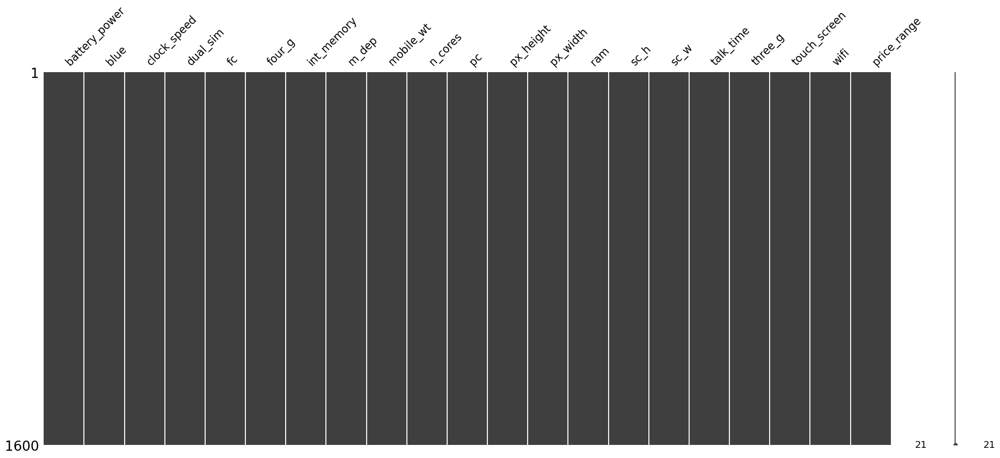

In [9]:
msno.matrix(train_set)

<Axes: >

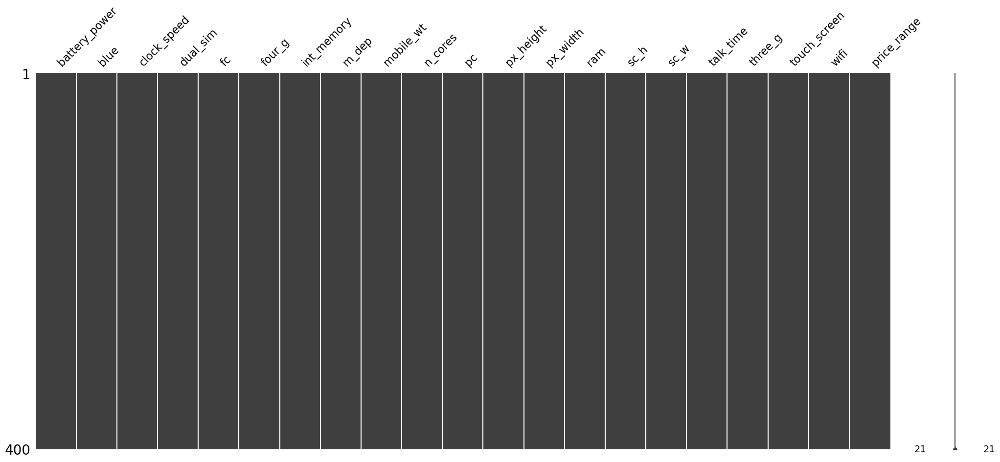

In [10]:
msno.matrix(test_set)

In [17]:
# imputer = SimpleImputer(strategy='median')

# cols = train_set.select_dtypes('float64').columns
# train_set[cols] = imputer.fit_transform(train_set[cols])
# test_set[cols] = imputer.transform(test_set[cols])
# imputer.statistics_

In [19]:
# msno.matrix(train_set)

In [21]:
# msno.matrix(test_set)

In [23]:
train_set.info()
train_set.dtypes

<class 'pandas.core.frame.DataFrame'>
Index: 1600 entries, 469 to 876
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   battery_power  1600 non-null   float64 
 1   blue           1600 non-null   float64 
 2   clock_speed    1600 non-null   float64 
 3   dual_sim       1600 non-null   float64 
 4   fc             1600 non-null   float64 
 5   four_g         1600 non-null   float64 
 6   int_memory     1600 non-null   float64 
 7   m_dep          1600 non-null   float64 
 8   mobile_wt      1600 non-null   float64 
 9   n_cores        1600 non-null   float64 
 10  pc             1600 non-null   float64 
 11  px_height      1600 non-null   float64 
 12  px_width       1600 non-null   float64 
 13  ram            1600 non-null   float64 
 14  sc_h           1600 non-null   float64 
 15  sc_w           1600 non-null   float64 
 16  talk_time      1600 non-null   float64 
 17  three_g        1600 non-null   float6

battery_power     float64
blue              float64
clock_speed       float64
dual_sim          float64
fc                float64
four_g            float64
int_memory        float64
m_dep             float64
mobile_wt         float64
n_cores           float64
pc                float64
px_height         float64
px_width          float64
ram               float64
sc_h              float64
sc_w              float64
talk_time         float64
three_g           float64
touch_screen      float64
wifi              float64
price_range      category
dtype: object

In [35]:
train_set['ram'].mean()
# train_set['ram'].median()
# train_set['ram'].mode()

2125.0075

In [37]:
train_set['ram'].std()
# train_set['ram'].var()

1085.6886857636703

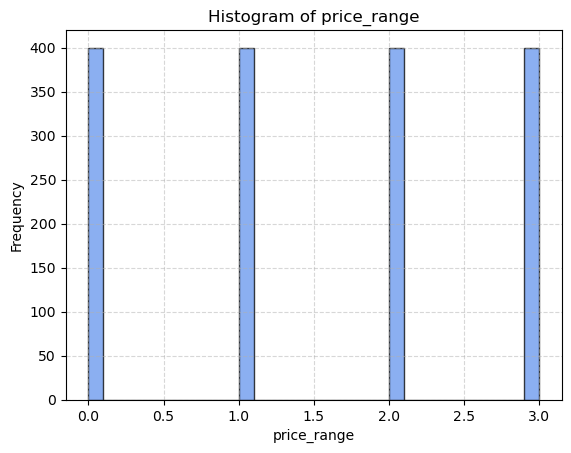

In [39]:
plt.hist(train_set.price_range, bins=30, color='cornflowerblue', edgecolor='black', alpha=0.75)
plt.xlabel('price_range')
plt.ylabel('Frequency')
plt.title('Histogram of price_range')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

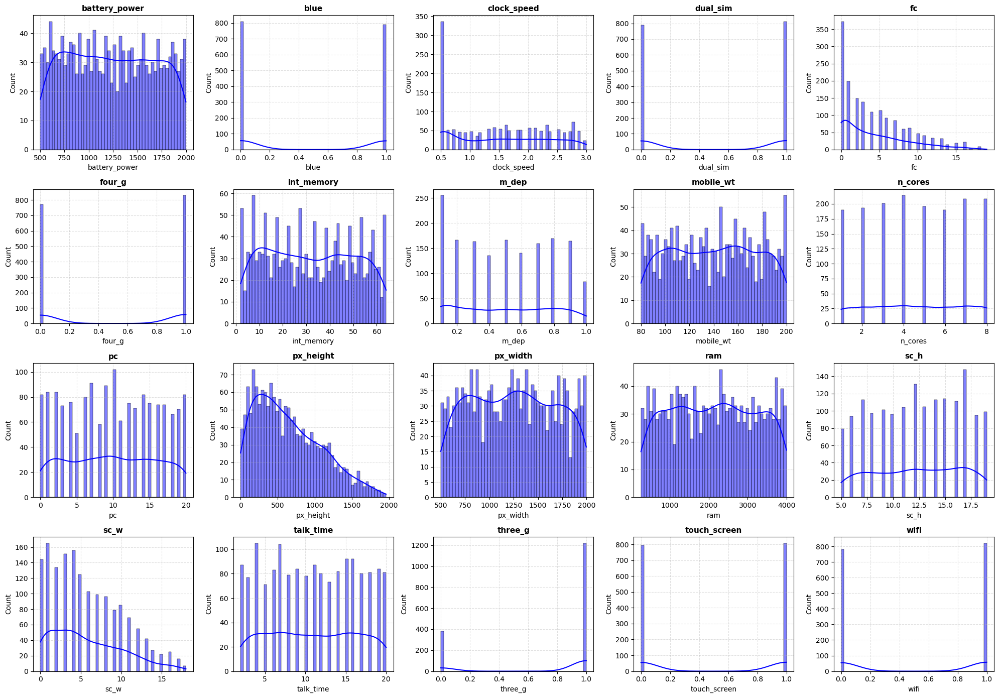

In [41]:
num_cols = train_set.select_dtypes(include=['int', 'float']).columns
# num_cols = train_set.columns

n = len(num_cols)

cols = 5                            
rows = math.ceil(n / cols)            

fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3.5*rows))
axes_flat = axes.flatten()           

for i, col in enumerate(num_cols):
    ax = axes_flat[i]
    sns.histplot(train_set[col].dropna(),
                 bins=50, kde=True,
                 color='b', ax=ax)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.4)
    
for j in range(n, len(axes_flat)):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.show()


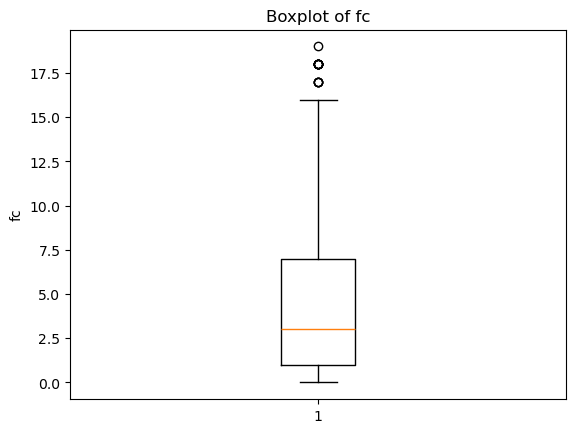

count    1600.000000
mean        4.322500
std         4.337799
min         0.000000
25%         1.000000
50%         3.000000
75%         7.000000
max        19.000000
Name: fc, dtype: float64


In [42]:
plt.boxplot(train_set.fc)
plt.title('Boxplot of fc')
plt.ylabel('fc')
plt.show()

print(train_set.fc.describe())

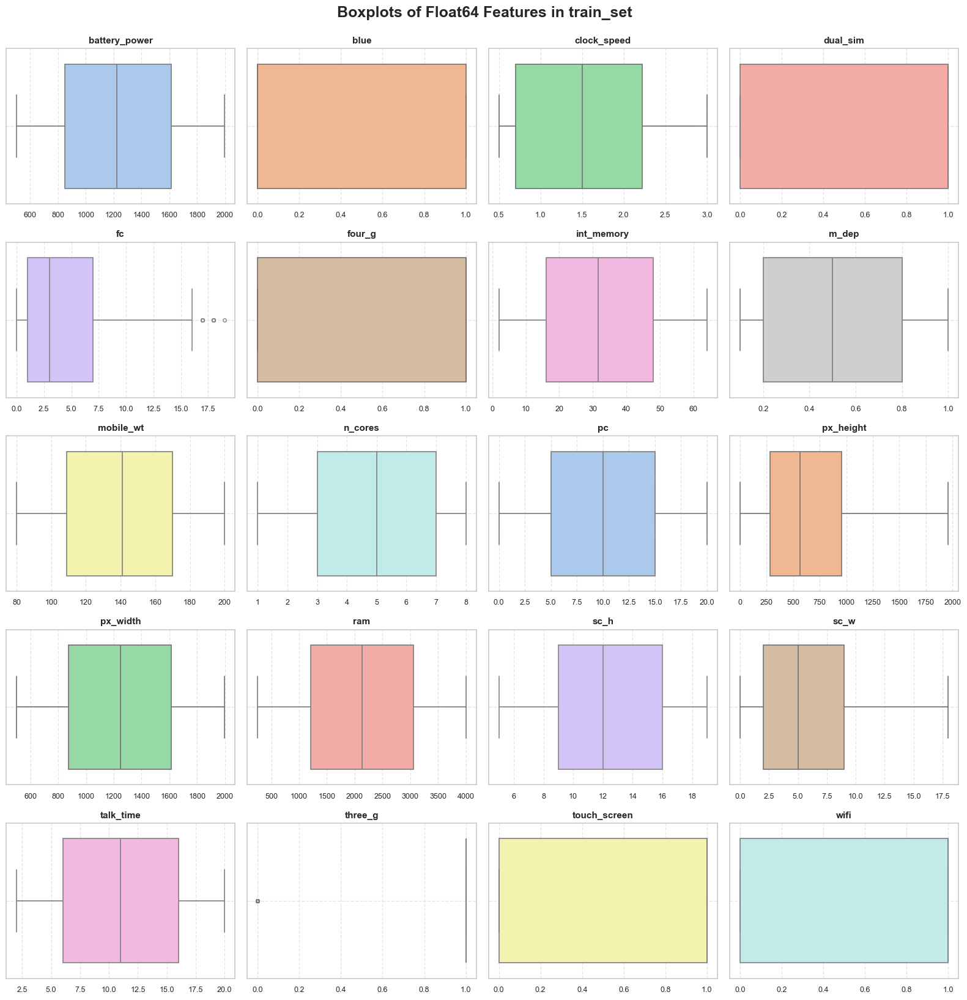

In [45]:
sns.set(style="whitegrid")

float_cols = train_set.select_dtypes('float64').columns
rows, cols = 5, 4
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))
axes_flat = axes.flatten()

palette = sns.color_palette("pastel", len(float_cols))

for i, col in enumerate(float_cols):
    ax = axes_flat[i]
    sns.boxplot(x=train_set[col], ax=ax, 
                color=palette[i % len(palette)],
                fliersize=4,
                linewidth=1.2,
                orient='h')
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

for j in range(len(float_cols), rows * cols):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.suptitle('Boxplots of Float64 Features in train_set', fontsize=18, fontweight='bold', y=1.02)
plt.show()


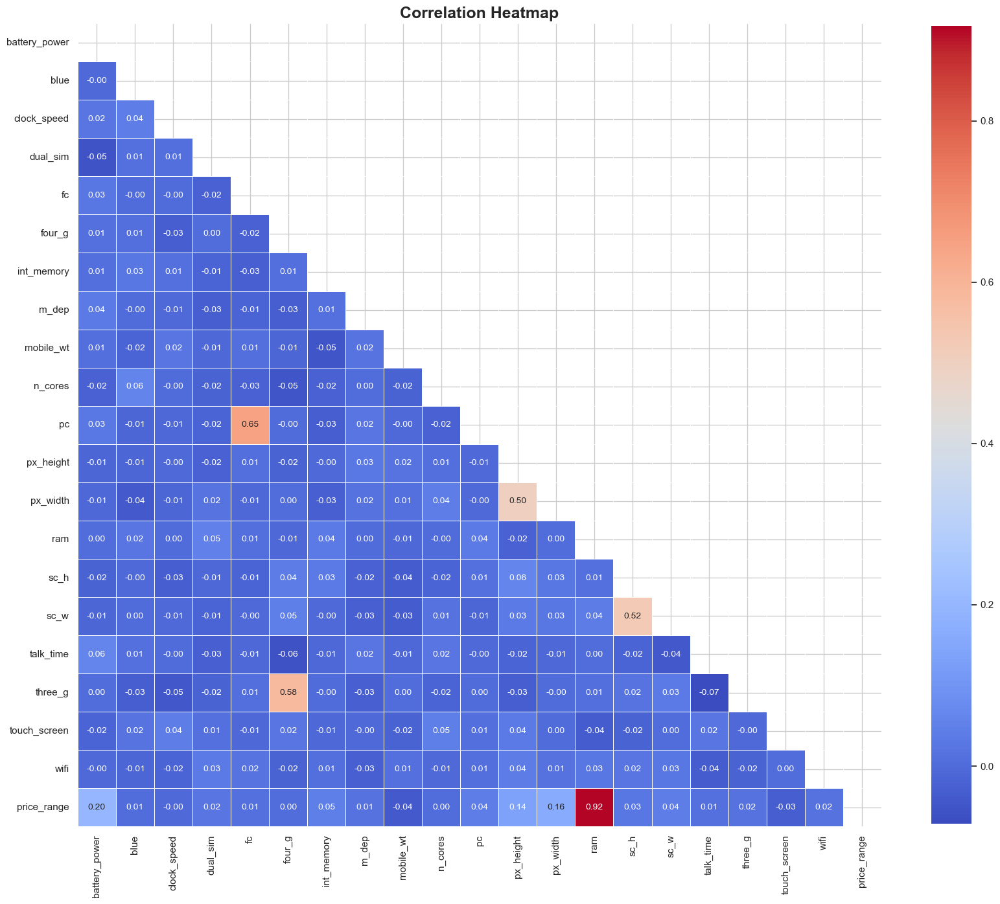

In [47]:
plt.figure(figsize=(20, 20))
corr = train_set.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(corr, annot=True, fmt=".2f", mask=mask, cmap='coolwarm', 
            square=True, linewidths=0.5, cbar_kws={"shrink": .8}, annot_kws={"size":10})

plt.title('Correlation Heatmap', fontsize=18, fontweight='bold')
plt.show()

In [49]:
corr[['price_range']].abs().sort_values(by='price_range')

,price_range
clock_speed,0.002633
n_cores,0.003791
four_g,0.003916
blue,0.005031
fc,0.009668
talk_time,0.012833
m_dep,0.013448
three_g,0.015093
wifi,0.016776
dual_sim,0.021804


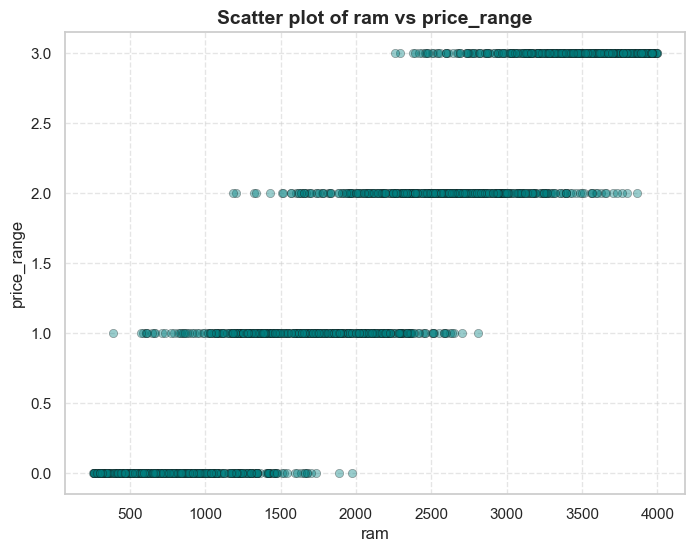

In [51]:
plt.figure(figsize=(8, 6))
plt.scatter(train_set.ram, train_set.price_range, alpha=0.4, color='teal', edgecolor='k', linewidth=0.5)
plt.xlabel('ram', fontsize=12)
plt.ylabel('price_range', fontsize=12)
plt.title('Scatter plot of ram vs price_range', fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

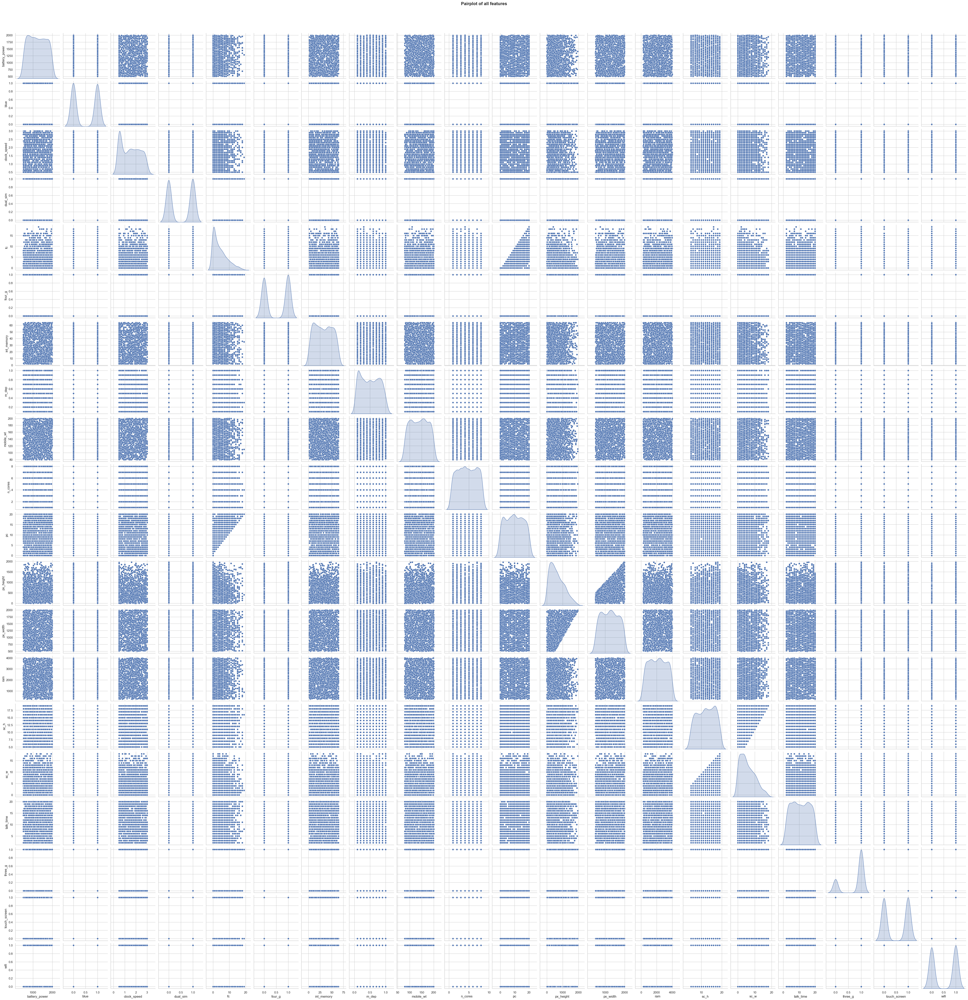

In [55]:
sns.pairplot(train_set, diag_kind='kde', height=2.5)
plt.suptitle('Pairplot of all features', y=1.02, fontsize=16, fontweight='bold')
plt.show()

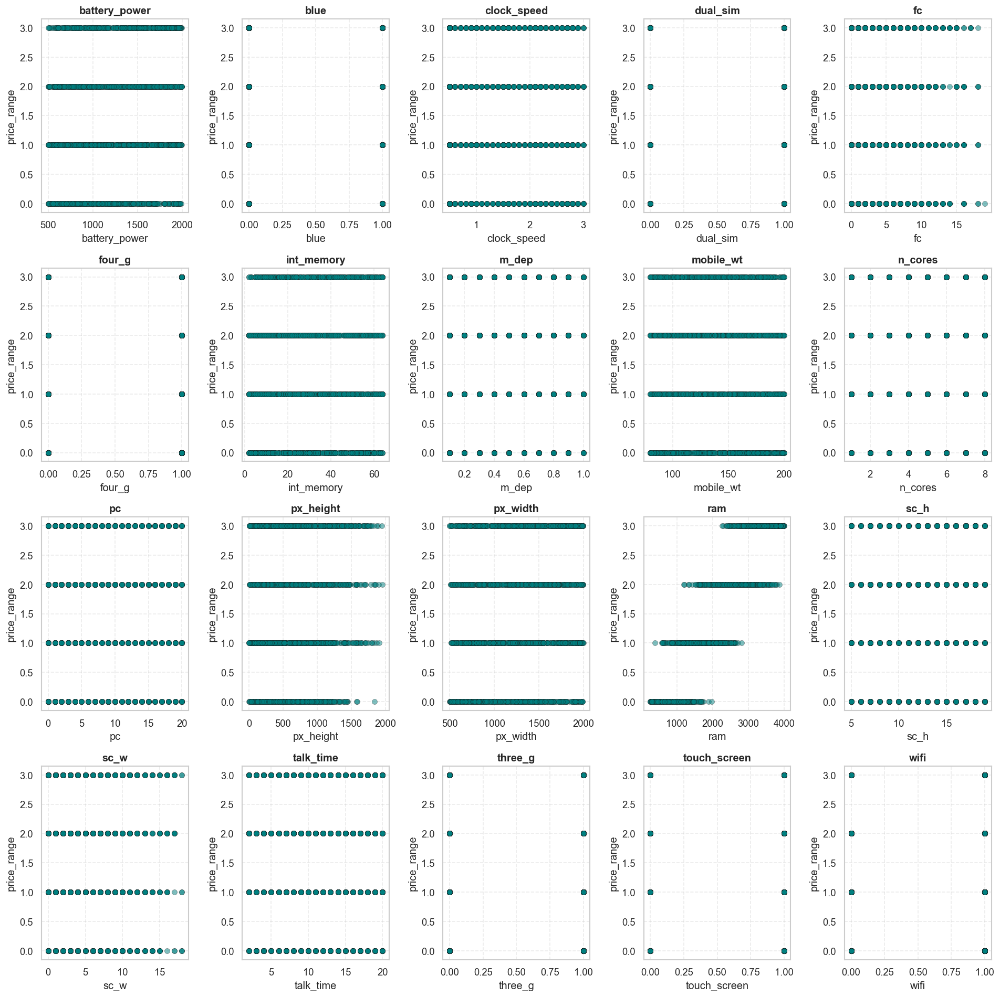

In [57]:
num_cols = train_set.select_dtypes(include=['int64', 'float64']).columns
# num_cols = train_set.columns  

n_cols = 5
n_rows = (len(num_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 16), dpi=120)
axes_flat = axes.flatten()

for i, col in enumerate(num_cols):
    ax = axes_flat[i]
    ax.scatter(train_set[col], train_set.price_range, alpha=0.5, color='teal', edgecolor='k', linewidth=0.4)
    ax.set_title(col, fontsize=12, fontweight='bold')
    ax.set_xlabel(col)
    ax.set_ylabel('price_range')
    ax.grid(True, linestyle='--', alpha=0.4)

for j in range(len(num_cols), len(axes_flat)):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.show()

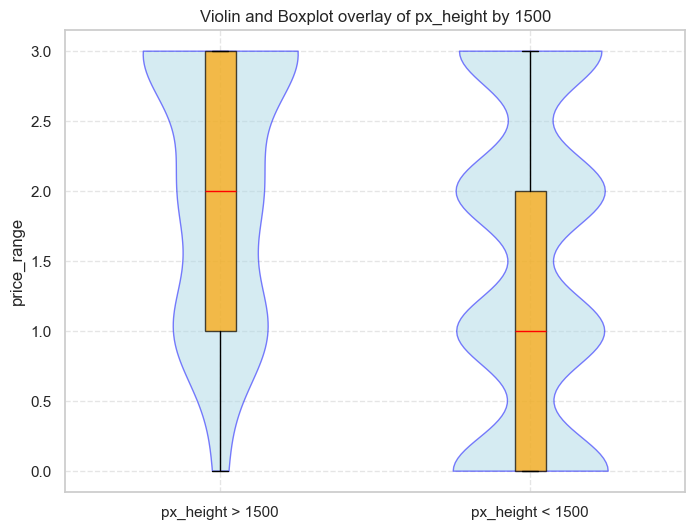

In [58]:
flags = train_set.px_height > 1500.0

data_true = train_set.price_range[flags].dropna()
data_false = train_set.price_range[~flags].dropna()

fig, ax = plt.subplots(figsize=(8, 6))

parts = ax.violinplot([data_true, data_false], positions=[1, 2], showmeans=False, showmedians=False, showextrema=False)

for pc in parts['bodies']:
    pc.set_facecolor('lightblue')
    pc.set_edgecolor('blue')
    pc.set_alpha(0.5)

box = ax.boxplot([data_true, data_false], positions=[1, 2], widths=0.1, patch_artist=True,
                 boxprops=dict(facecolor='orange', alpha=0.7),
                 medianprops=dict(color='red'),
                 whiskerprops=dict(color='black'),
                 capprops=dict(color='black'),
                 flierprops=dict(marker='o', color='red', alpha=0.5))

ax.set_xticks([1, 2])
ax.set_xticklabels(['px_height > 1500', 'px_height < 1500'])
ax.set_ylabel('price_range')
ax.set_title('Violin and Boxplot overlay of px_height by 1500')
ax.grid(True, linestyle='--', alpha=0.5)

plt.show()

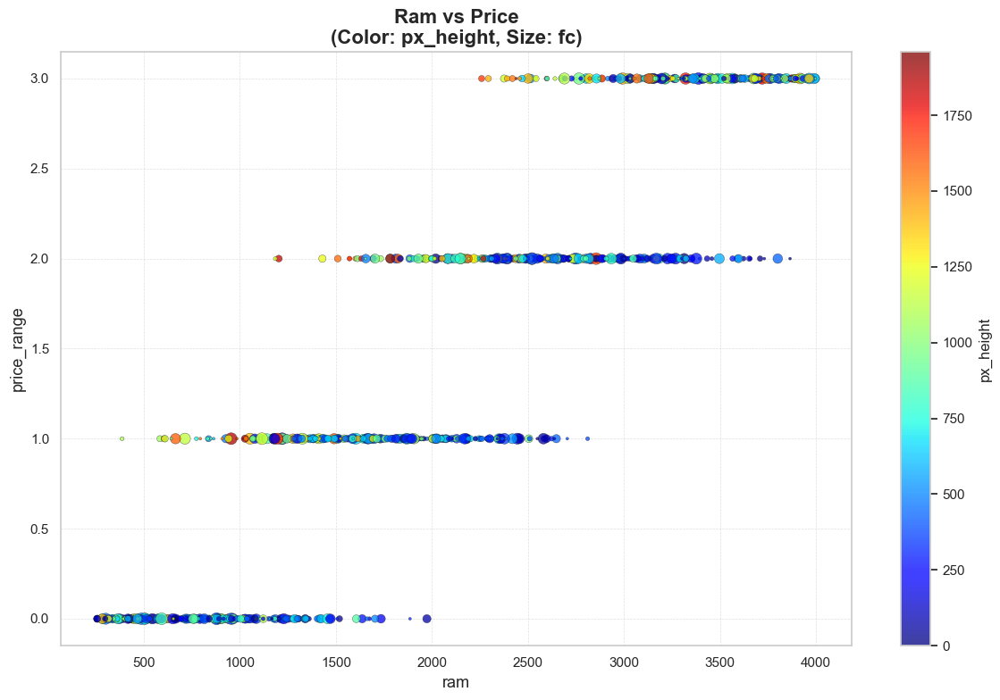

In [61]:
sns.set(style="whitegrid")

norm = Normalize(vmin=train_set.px_height.min(), vmax=train_set.px_height.max())

plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    train_set.ram,
    train_set.price_range,
    c=train_set.px_height,
    cmap='jet',
    norm=norm,
    s=train_set.fc * 5,
    alpha=0.75,
    edgecolors='k',
    linewidth=0.3
)

cbar = plt.colorbar(scatter)
cbar.set_label('px_height', fontsize=12)

plt.title('Ram vs Price\n(Color: px_height, Size: fc)', fontsize=16, fontweight='bold')
plt.xlabel('ram', fontsize=13)
plt.ylabel('price_range', fontsize=13)

plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

plt.tight_layout()
plt.show()

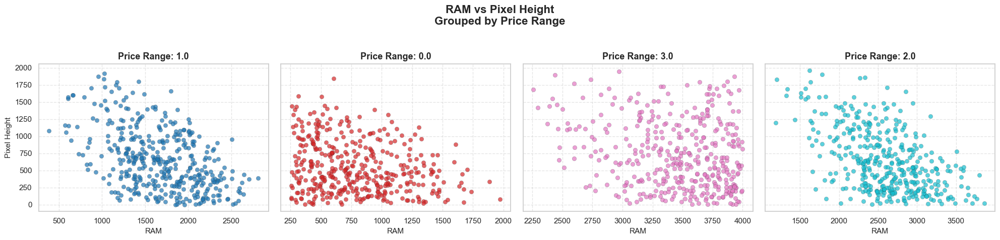

In [63]:
ocean_cats = train_set['price_range'].unique()
colormap = plt.cm.get_cmap('tab10', len(ocean_cats))

fig, axes = plt.subplots(1, len(ocean_cats), figsize=(5 * len(ocean_cats), 5), sharey=True)

if len(ocean_cats) == 1:
    axes = [axes]

for i, cat in enumerate(ocean_cats):
    ax = axes[i]
    mask = train_set['price_range'] == cat

    ax.scatter(
        train_set.loc[mask, 'ram'],
        train_set.loc[mask, 'px_height'],
        color=colormap(i),
        alpha=0.7,
        edgecolors='k',
        linewidths=0.2
    )

    ax.set_title(f"Price Range: {cat}", fontsize=13, fontweight='bold')
    ax.set_xlabel('RAM', fontsize=11)
    if i == 0:
        ax.set_ylabel('Pixel Height', fontsize=11)
    
    ax.grid(True, linestyle='--', alpha=0.5)

fig.suptitle('RAM vs Pixel Height\nGrouped by Price Range', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [65]:
train_set.dtypes

battery_power     float64
blue              float64
clock_speed       float64
dual_sim          float64
fc                float64
four_g            float64
int_memory        float64
m_dep             float64
mobile_wt         float64
n_cores           float64
pc                float64
px_height         float64
px_width          float64
ram               float64
sc_h              float64
sc_w              float64
talk_time         float64
three_g           float64
touch_screen      float64
wifi              float64
price_range      category
dtype: object

In [67]:
train_set

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
469,1845.0,1.0,0.5,1.0,10.0,0.0,61.0,0.3,96.0,1.0,...,292.0,695.0,1731.0,9.0,5.0,6.0,0.0,0.0,0.0,1.0
565,1271.0,1.0,0.5,0.0,12.0,0.0,32.0,0.1,113.0,7.0,...,1350.0,1949.0,445.0,15.0,14.0,14.0,0.0,0.0,1.0,0.0
396,788.0,0.0,2.5,1.0,4.0,1.0,57.0,0.9,91.0,8.0,...,42.0,1161.0,3969.0,12.0,8.0,6.0,1.0,1.0,1.0,3.0
452,1406.0,0.0,0.5,1.0,2.0,1.0,34.0,0.8,98.0,3.0,...,1017.0,1366.0,3915.0,9.0,8.0,2.0,1.0,0.0,1.0,3.0
325,920.0,0.0,2.1,1.0,5.0,0.0,25.0,0.4,115.0,7.0,...,209.0,1078.0,785.0,10.0,7.0,5.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1170,1100.0,1.0,1.6,0.0,12.0,0.0,15.0,0.1,112.0,8.0,...,919.0,1344.0,757.0,12.0,2.0,16.0,1.0,1.0,1.0,0.0
100,1883.0,1.0,0.5,0.0,3.0,1.0,10.0,0.3,146.0,6.0,...,836.0,1739.0,2600.0,16.0,8.0,20.0,1.0,0.0,0.0,3.0
63,1720.0,0.0,2.0,0.0,15.0,1.0,55.0,0.5,168.0,2.0,...,753.0,1353.0,2148.0,14.0,2.0,5.0,1.0,1.0,1.0,2.0
180,703.0,1.0,2.7,0.0,12.0,1.0,30.0,0.3,113.0,1.0,...,218.0,1065.0,1472.0,14.0,7.0,7.0,1.0,0.0,0.0,0.0


In [14]:
target_column = ['price_range', 'blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']

train_set_features = train_set.drop(columns=target_column)
test_set_features = test_set.drop(columns=target_column)

scaler = StandardScaler()
train_set_transformed = scaler.fit_transform(train_set_features)
test_set_transformed = scaler.transform(test_set_features)

train_set_transformed = pd.DataFrame(train_set_transformed, columns=train_set_features.columns, index=train_set.index)
test_set_transformed = pd.DataFrame(test_set_transformed, columns=test_set_features.columns, index=test_set.index)

last_column_train = train_set[target_column].reset_index(drop=True)
last_column_test = test_set[target_column].reset_index(drop=True)

trans_train_set = pd.concat([train_set_transformed.reset_index(drop=True), last_column_train], axis=1)
trans_test_set = pd.concat([test_set_transformed.reset_index(drop=True), last_column_test], axis=1)


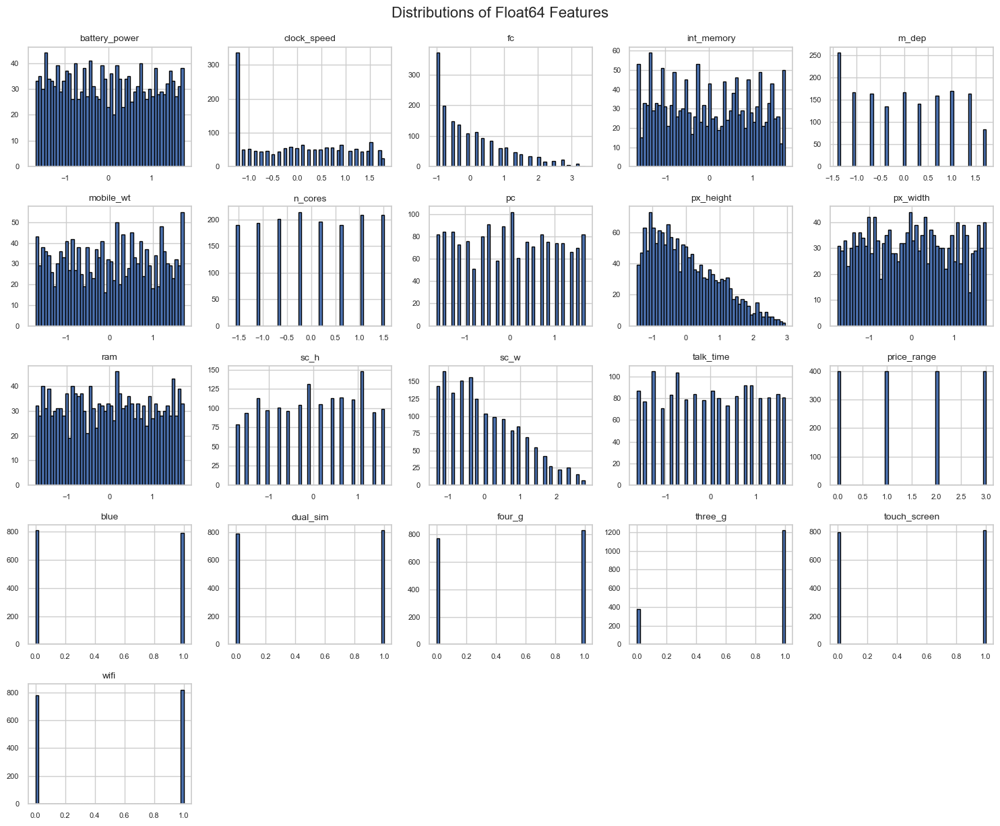

In [73]:
sns.set(style="whitegrid")

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes_flat = axes.flatten()

selected_cols = trans_train_set.columns
# float_cols = trans_train_set.select_dtypes('float64').columns
# selected_cols = []


for i, col in enumerate(selected_cols):
    ax = axes_flat[i]
    ax.hist(trans_train_set[col], bins=50, color='b', edgecolor='black')
    ax.set_title(col, fontsize=10)
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)

for j in range(len(selected_cols), rows * cols):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.suptitle('Distributions of Float64 Features', fontsize=16, y=1.02)
plt.show()


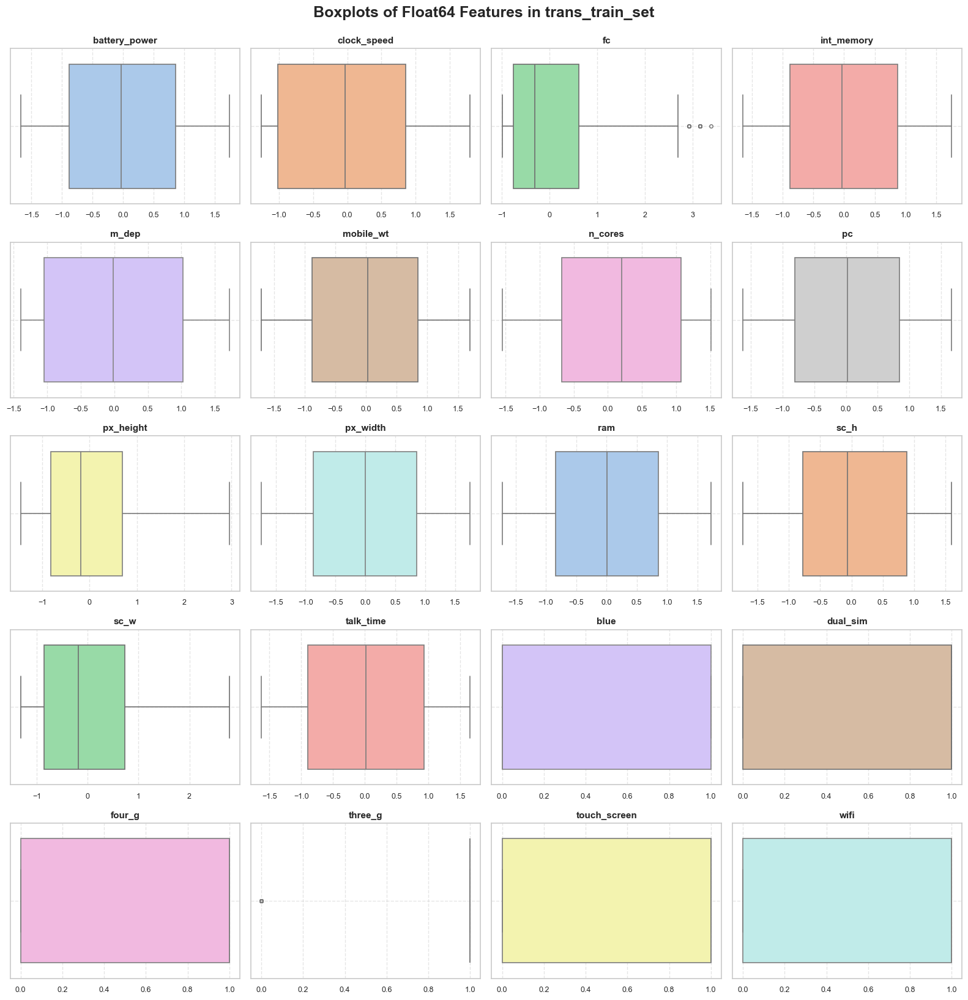

In [75]:
sns.set(style="whitegrid")

float_cols = trans_train_set.select_dtypes('float64').columns
rows, cols = 5, 4
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))
axes_flat = axes.flatten()

palette = sns.color_palette("pastel", len(float_cols))

for i, col in enumerate(float_cols):
    ax = axes_flat[i]
    sns.boxplot(x=trans_train_set[col], ax=ax, 
                color=palette[i % len(palette)],
                fliersize=4,
                linewidth=1.2,
                orient='h')
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

for j in range(len(float_cols), rows * cols):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.suptitle('Boxplots of Float64 Features in trans_train_set', fontsize=18, fontweight='bold', y=1.02)
plt.show()


In [77]:
trans_test_set

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,...,sc_h,sc_w,talk_time,price_range,blue,dual_sim,four_g,three_g,touch_screen,wifi
0,1.224774,1.187471,2.692875,-0.003457,0.333799,0.847614,0.635693,1.338859,1.278469,0.525696,...,1.123206,0.050466,0.378745,3.0,1.0,0.0,1.0,1.0,0.0,1.0
1,1.702047,0.086474,-0.535577,-1.098827,-1.050719,-1.703946,0.198227,1.668399,-0.810102,-1.523423,...,0.170958,-0.633813,0.560944,1.0,1.0,0.0,1.0,1.0,1.0,1.0
2,-1.572638,-0.647524,-0.996785,1.310987,-0.358460,0.167198,-0.239239,0.679779,0.022626,0.956967,...,1.123206,1.875207,-0.532248,0.0,0.0,1.0,1.0,1.0,1.0,1.0
3,-0.273269,-1.136856,-0.996785,-0.058226,-1.050719,0.167198,-1.114171,-0.473611,1.375245,0.887031,...,-1.019352,0.278558,0.560944,2.0,1.0,1.0,0.0,0.0,1.0,1.0
4,0.724665,-1.259189,1.539856,-1.482207,1.718316,-0.456517,-0.676705,0.350239,-0.567035,0.775133,...,-1.257414,-0.405720,1.289739,3.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.656157,1.187471,1.539856,0.489459,1.718316,-1.250335,-0.239239,1.668399,-1.041915,-1.180738,...,-1.257414,-1.318091,-0.350049,1.0,0.0,1.0,1.0,1.0,1.0,1.0
396,0.363856,-1.136856,-0.996785,0.270385,0.679928,-0.173010,-0.239239,0.844549,-0.195684,-0.162006,...,1.361268,-0.633813,1.471937,2.0,1.0,0.0,0.0,0.0,0.0,1.0
397,0.551112,-0.892190,1.770460,0.872839,0.679928,-1.165283,0.198227,1.174089,0.105898,-0.849708,...,-1.733538,-0.861905,-0.896645,1.0,1.0,1.0,0.0,0.0,0.0,1.0
398,1.555896,0.453473,-0.535577,-1.208364,0.333799,-0.853426,0.198227,0.020699,1.177191,0.691211,...,-1.257414,-1.089998,0.925341,2.0,0.0,0.0,0.0,1.0,1.0,1.0


In [79]:
trans_train_set.columns

Index(['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep',
       'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h',
       'sc_w', 'talk_time', 'price_range', 'blue', 'dual_sim', 'four_g',
       'three_g', 'touch_screen', 'wifi'],
      dtype='object')

In [15]:
power_trans_train_set = trans_train_set.copy()
power_trans_test_set = trans_test_set.copy()

# cols_to_transform = trans_train_set.columns[:-1]
cols_to_transform = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep',
                     'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h',
                     'sc_w', 'talk_time',]

pt = PowerTransformer(method='yeo-johnson')

power_trans_train_set[cols_to_transform] = pt.fit_transform(trans_train_set[cols_to_transform])
power_trans_test_set[cols_to_transform] = pt.transform(trans_test_set[cols_to_transform])

# print(power_trans_train_set.head())
power_trans_test_set

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,...,sc_h,sc_w,talk_time,price_range,blue,dual_sim,four_g,three_g,touch_screen,wifi
0,1.216793,1.169543,1.890270,0.016393,0.359137,0.847050,0.634225,1.335166,1.240340,0.532329,...,1.135401,0.239026,0.384201,3.0,1.0,0.0,1.0,1.0,0.0,1.0
1,1.674786,0.147236,-0.414809,-1.104458,-1.056525,-1.699556,0.195628,1.660714,-0.816131,-1.535653,...,0.139286,-0.572001,0.565154,1.0,1.0,0.0,1.0,1.0,1.0,1.0
2,-1.596362,-0.618640,-1.260493,1.298103,-0.334344,0.164680,-0.241783,0.682126,0.211139,0.957360,...,1.135401,1.621261,-0.527869,0.0,0.0,1.0,1.0,1.0,1.0,1.0
3,-0.258005,-1.164078,-1.260493,-0.038486,-1.056525,0.164680,-1.113431,-0.470052,1.305367,0.888622,...,-1.018175,0.458796,0.565154,2.0,1.0,1.0,0.0,0.0,1.0,1.0
4,0.731942,-1.303908,1.414494,-1.505523,1.672131,-0.458482,-0.678037,0.354388,-0.483653,0.778498,...,-1.240675,-0.277125,1.285538,3.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.665054,1.169543,1.414494,0.503921,1.672131,-1.248863,-0.241783,1.660714,-1.155678,-1.185055,...,-1.240675,-1.584333,-0.344466,1.0,0.0,1.0,1.0,1.0,1.0,1.0
396,0.378157,-1.164078,-1.260493,0.288530,0.694613,-0.175523,-0.241783,0.845663,-0.026282,-0.152629,...,1.391766,-0.572001,1.464929,2.0,1.0,0.0,0.0,0.0,0.0,1.0
397,0.562243,-0.888437,1.523069,0.876878,0.694613,-1.164289,0.195628,1.172168,0.295168,-0.847773,...,-1.679548,-0.889030,-0.895812,1.0,1.0,1.0,0.0,0.0,0.0,1.0
398,1.534969,0.501507,-0.414809,-1.218673,0.359137,-0.853976,0.195628,0.025571,1.170734,0.695785,...,-1.240675,-1.226851,0.925961,2.0,0.0,0.0,0.0,1.0,1.0,1.0


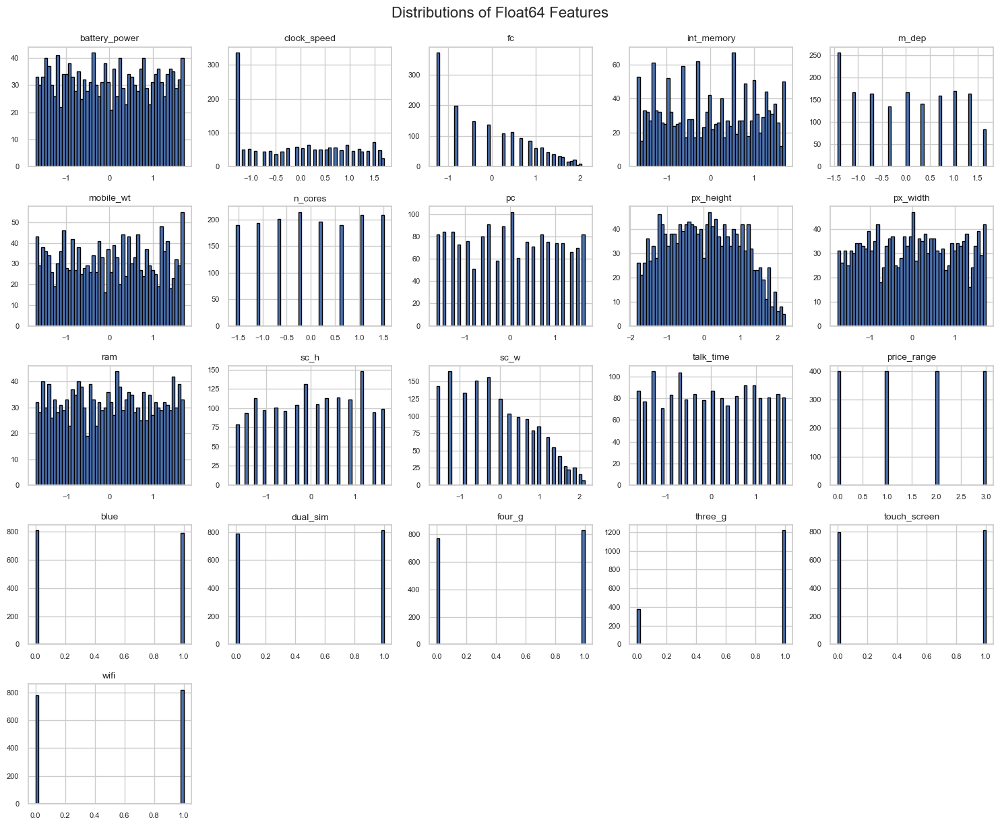

In [83]:
sns.set(style="whitegrid")

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes_flat = axes.flatten()

# float_cols = power_trans_train_set.select_dtypes('float64').columns
float_cols = power_trans_train_set.columns


for i, col in enumerate(float_cols):
    ax = axes_flat[i]
    ax.hist(power_trans_train_set[col], bins=50, color='b', edgecolor='black')
    ax.set_title(col, fontsize=10)
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)

for j in range(len(float_cols), rows * cols):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.suptitle('Distributions of Float64 Features', fontsize=16, y=1.02)
plt.show()

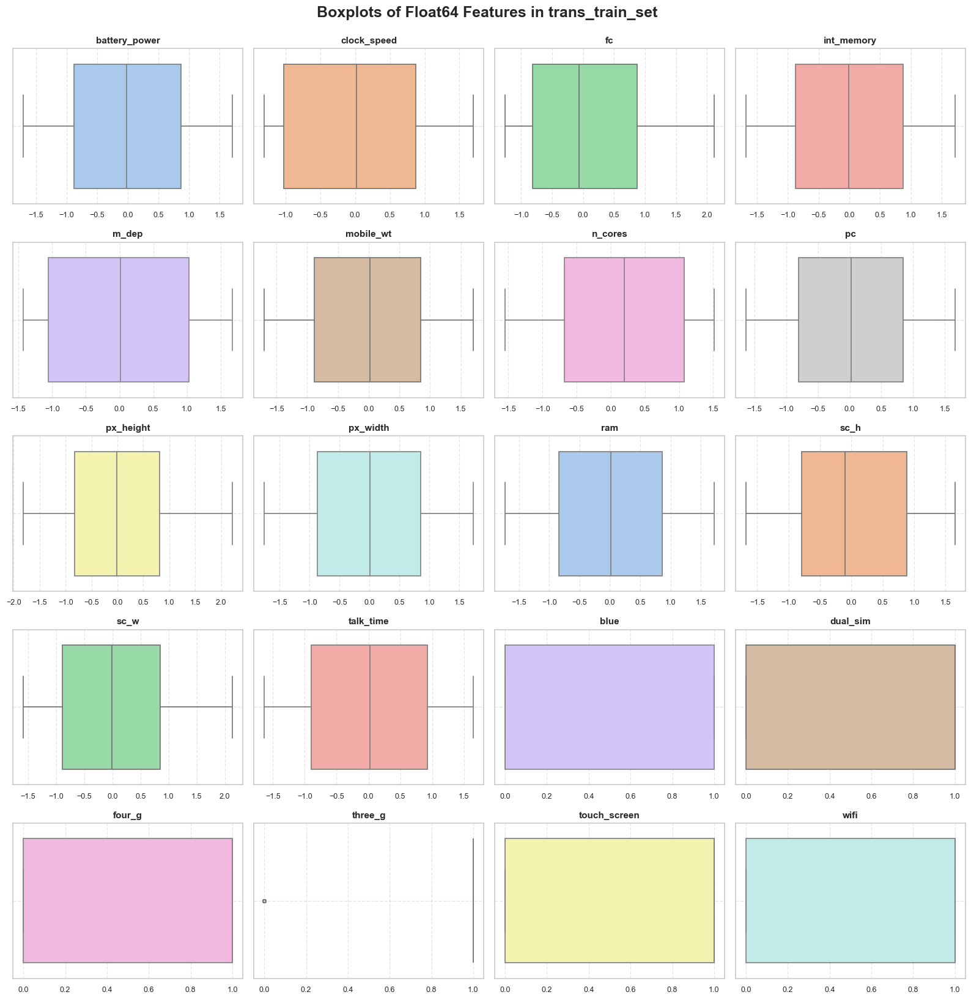

In [84]:
sns.set(style="whitegrid")

float_cols = power_trans_train_set.select_dtypes('float64').columns
rows, cols = 5, 4
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))
axes_flat = axes.flatten()

palette = sns.color_palette("pastel", len(float_cols))

for i, col in enumerate(float_cols):
    ax = axes_flat[i]
    sns.boxplot(x=power_trans_train_set[col], ax=ax, 
                color=palette[i % len(palette)],
                fliersize=4,
                linewidth=1.2,
                orient='h')
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

for j in range(len(float_cols), rows * cols):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
plt.suptitle('Boxplots of Float64 Features in trans_train_set', fontsize=18, fontweight='bold', y=1.02)
plt.show()


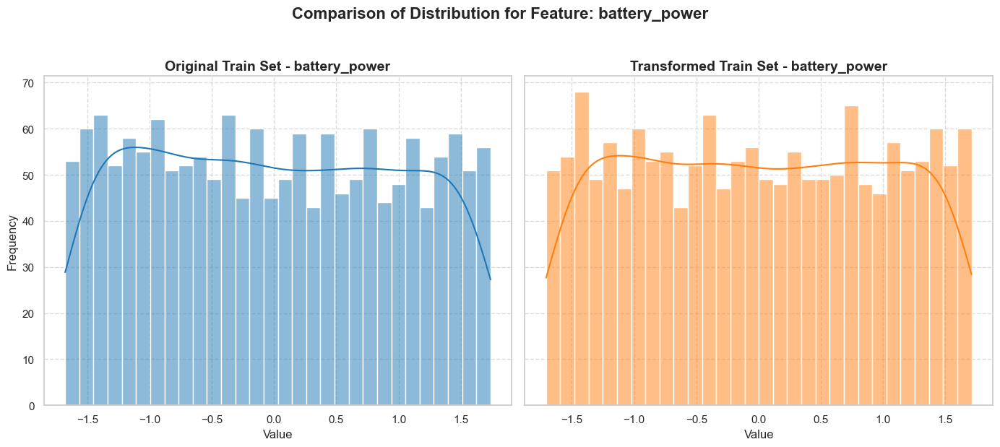

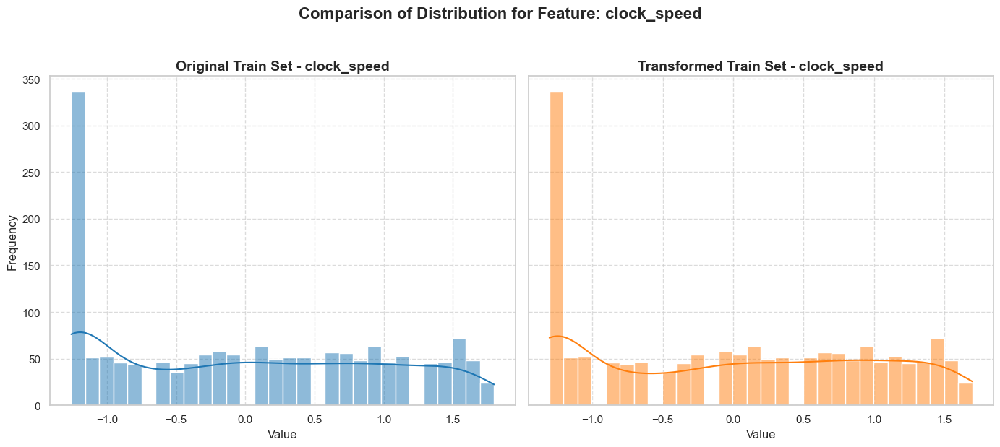

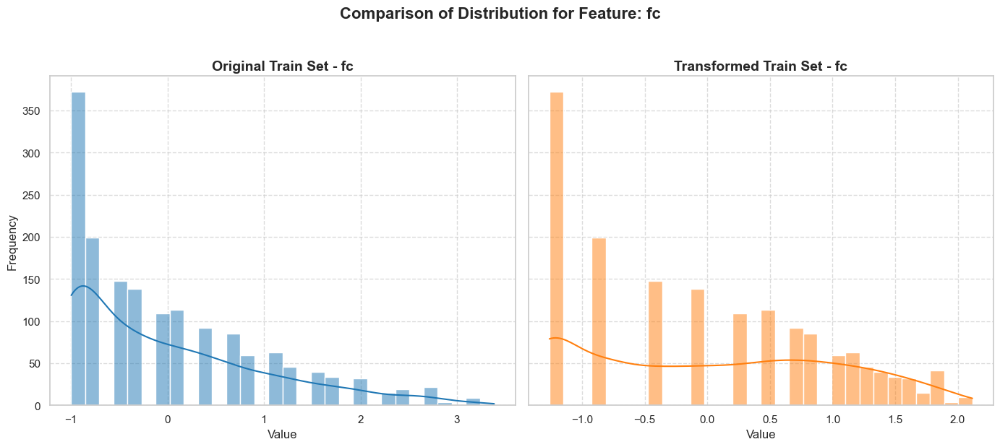

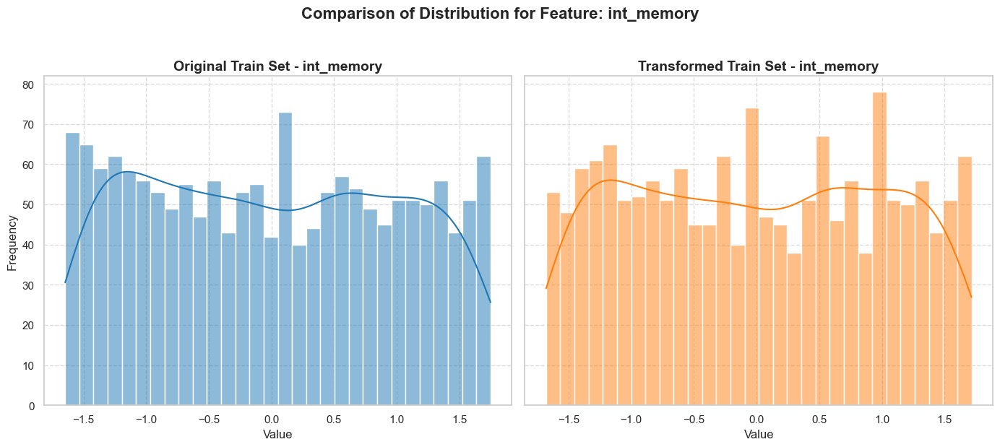

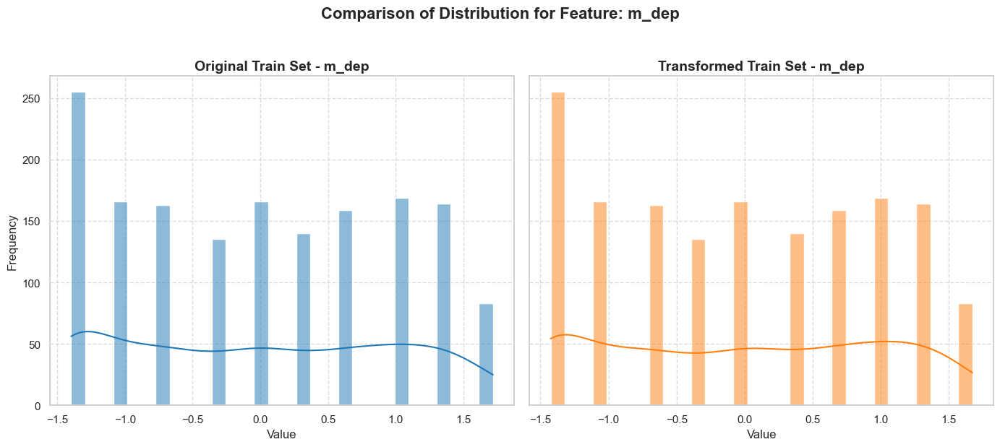

...

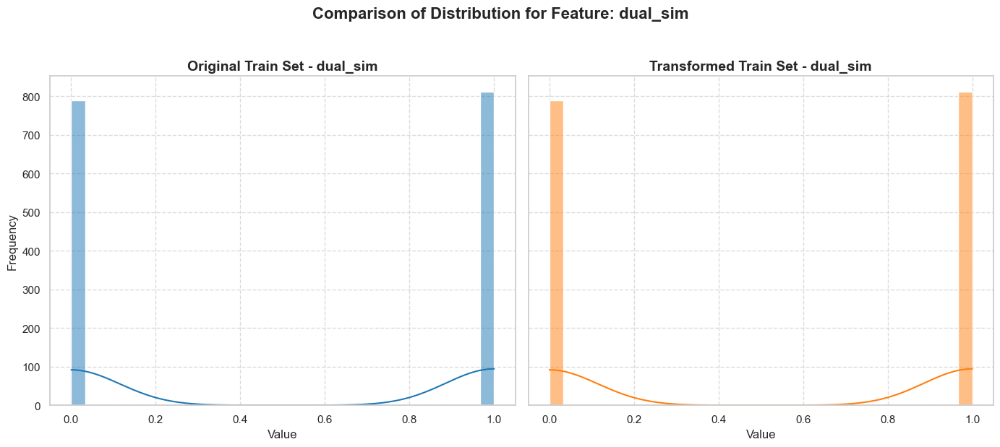

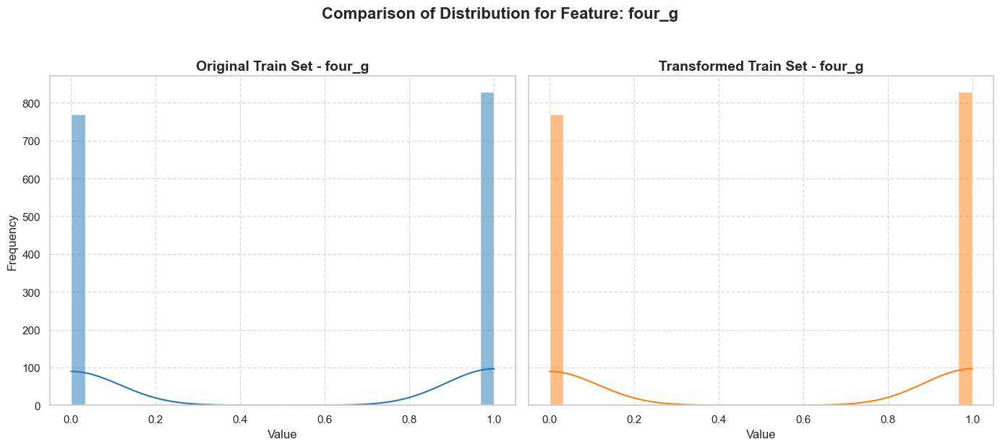

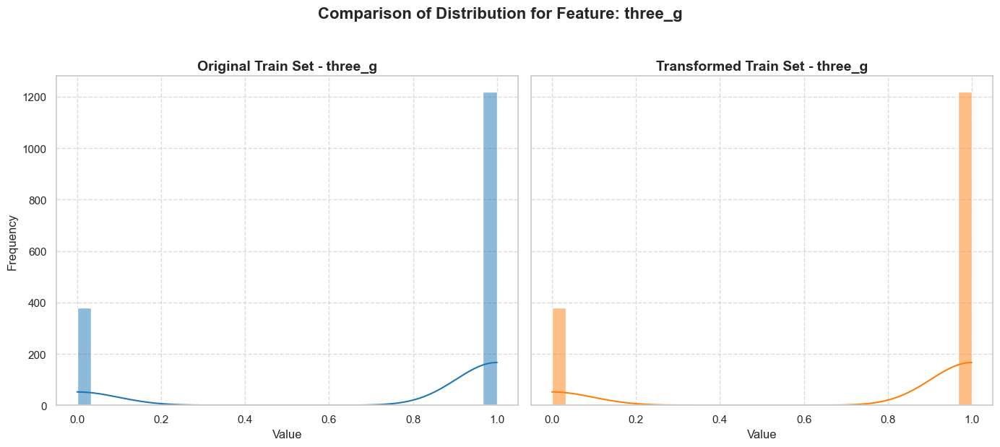

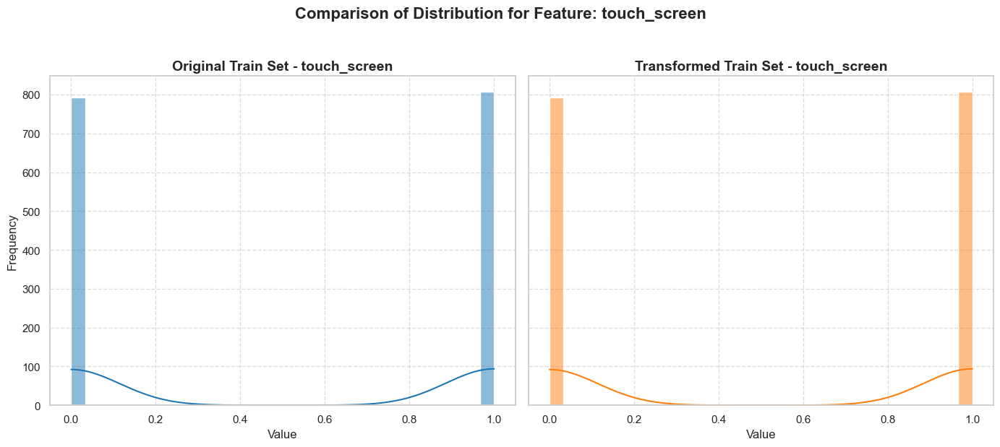

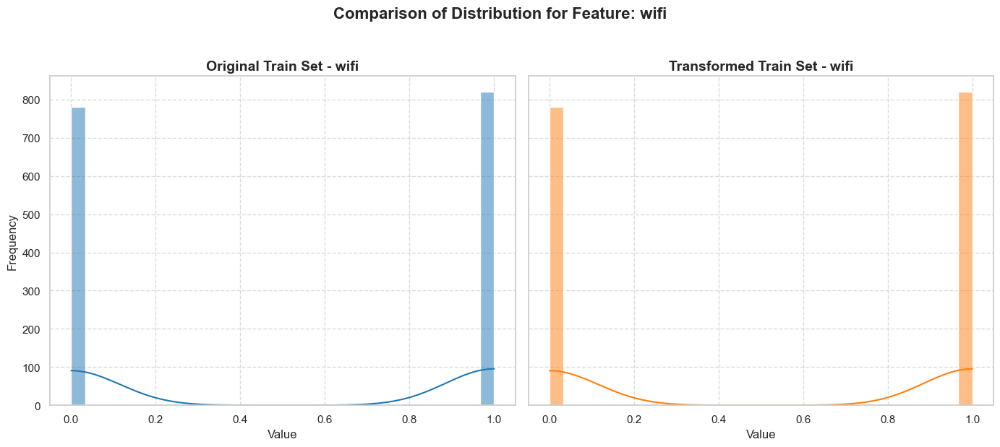

In [87]:
def plot_side_by_side_histograms(train_set, train_set_transformed):
    columns = train_set.columns.intersection(train_set_transformed.columns)
    
    sns.set(style="whitegrid")
    
    for col in columns:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

        sns.histplot(train_set[col].dropna(), bins=30, kde=True, color="#1f77b4", ax=axes[0])
        axes[0].set_title(f"Original Train Set - {col}", fontsize=14, weight='bold')
        axes[0].set_xlabel("Value", fontsize=12)
        axes[0].set_ylabel("Frequency", fontsize=12)
        axes[0].grid(True, linestyle='--', alpha=0.7)

        sns.histplot(train_set_transformed[col].dropna(), bins=30, kde=True, color="#ff7f0e", ax=axes[1])
        axes[1].set_title(f"Transformed Train Set - {col}", fontsize=14, weight='bold')
        axes[1].set_xlabel("Value", fontsize=12)
        axes[1].grid(True, linestyle='--', alpha=0.7)
        
        fig.suptitle(f"Comparison of Distribution for Feature: {col}", fontsize=16, weight='bold', y=1.03)
        
        plt.tight_layout()
        plt.show()

plot_side_by_side_histograms(trans_train_set, power_trans_train_set)

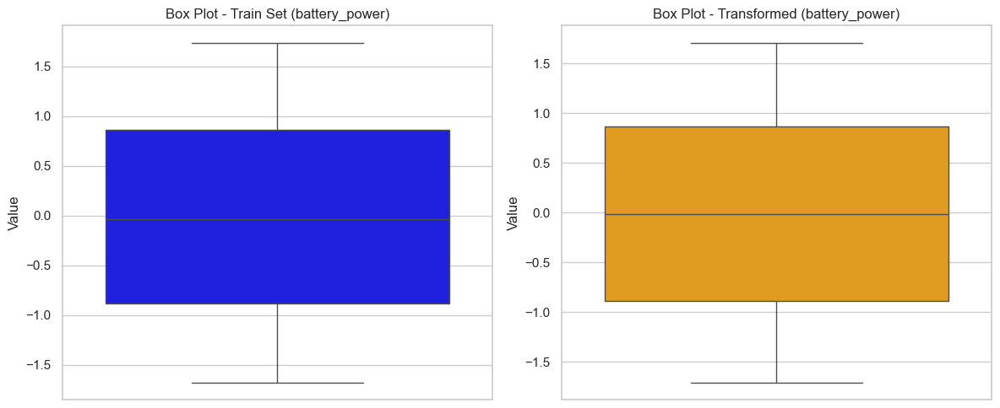

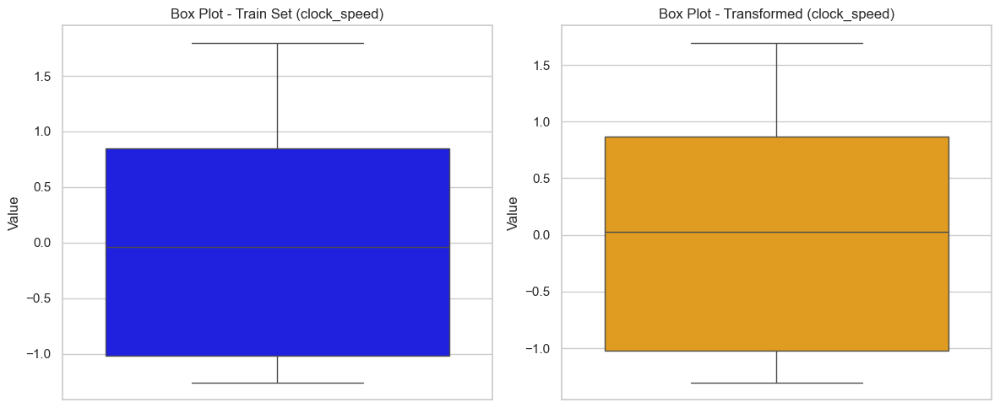

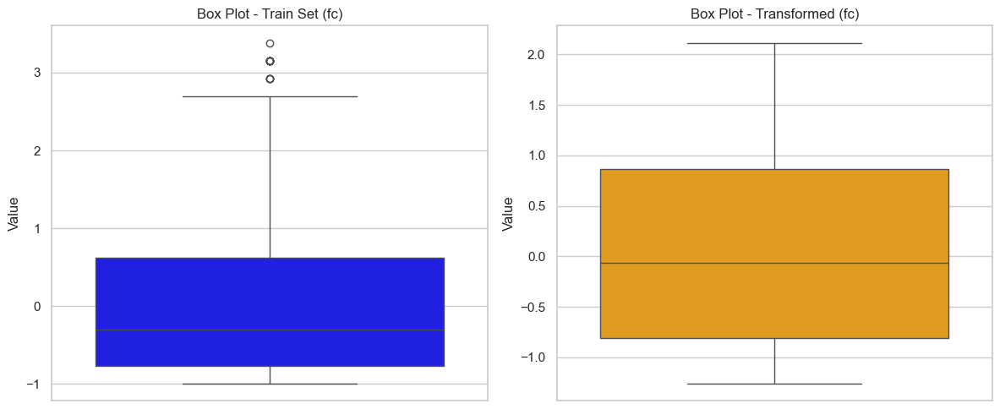

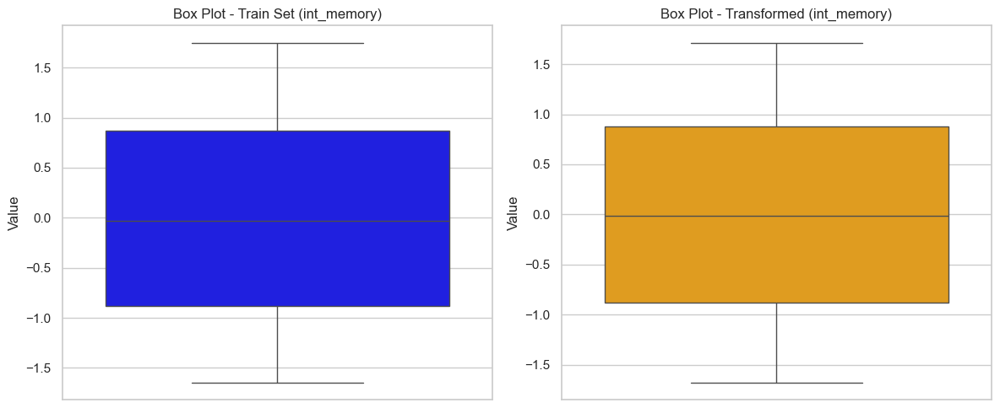

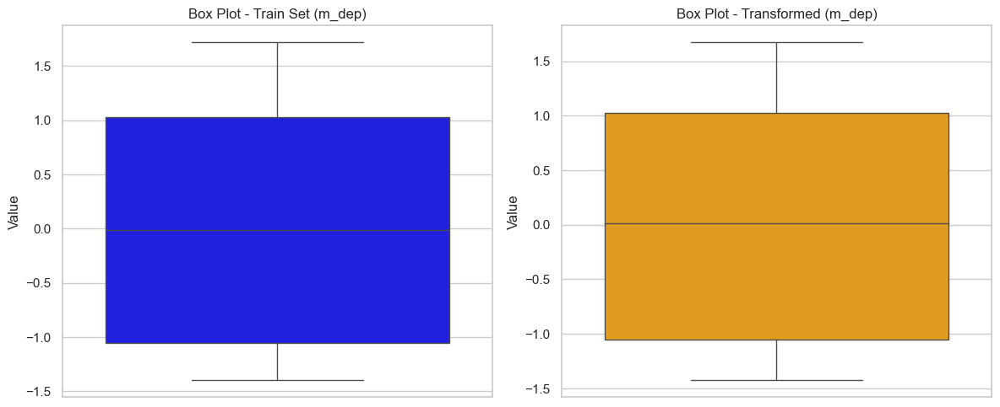

...

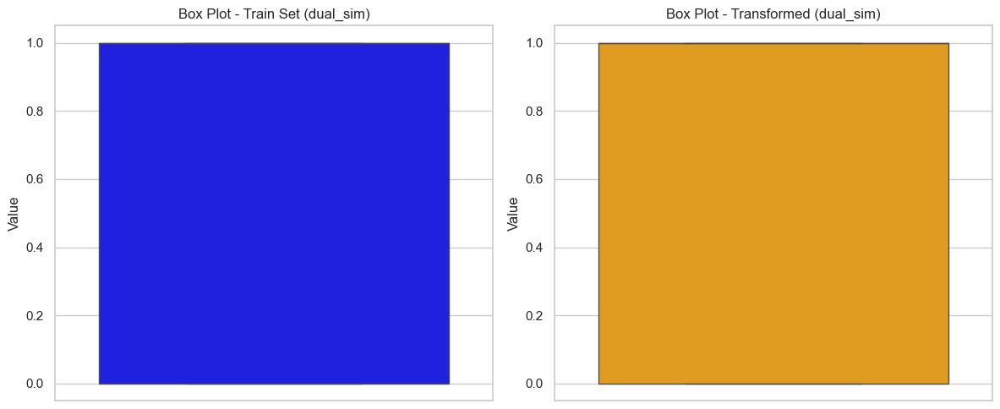

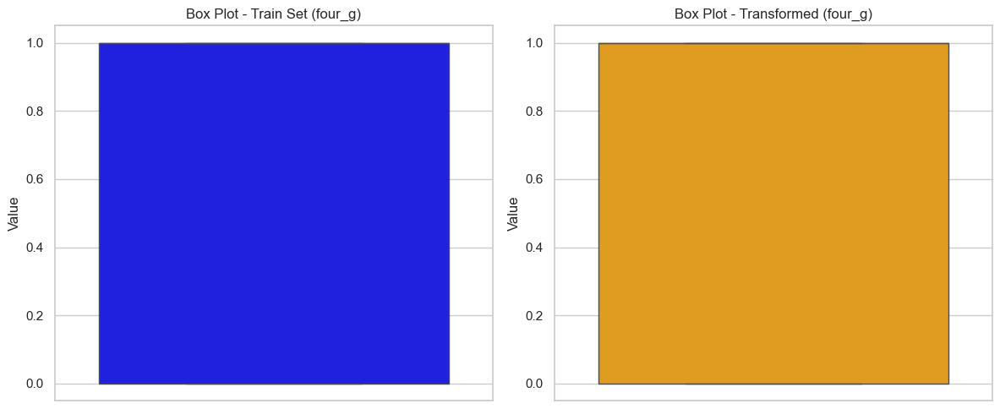

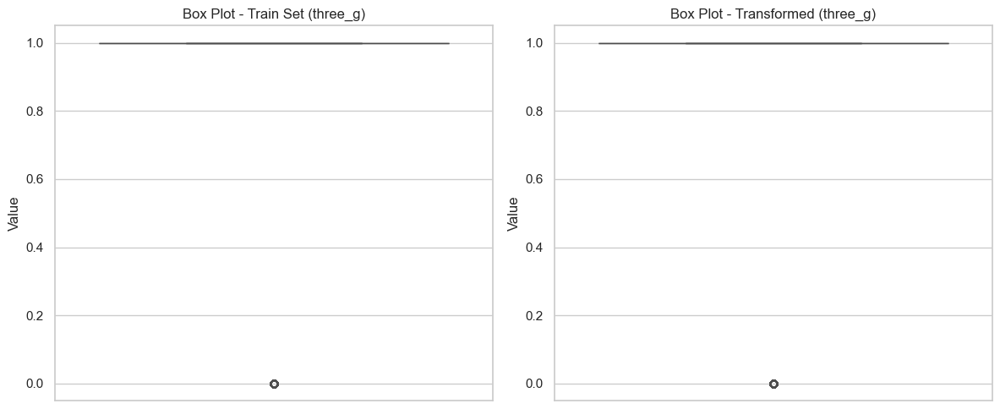

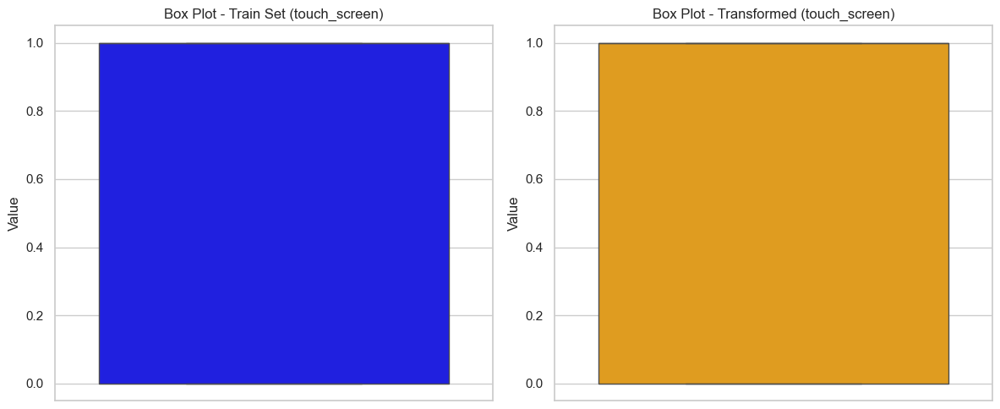

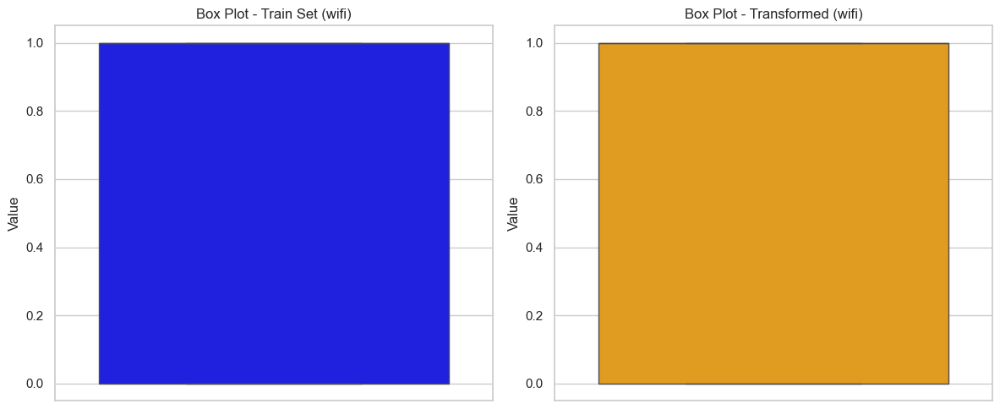

In [88]:
def plot_side_by_side_boxplots(train_set, train_set_transformed):
    columns = train_set.columns.intersection(train_set_transformed.columns)

    for col in columns:
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        sns.boxplot(y=train_set[col].dropna(), ax=axes[0], color="blue")
        axes[0].set_title(f"Box Plot - Train Set ({col})")
        axes[0].set_ylabel("Value")

        sns.boxplot(y=train_set_transformed[col].dropna(), ax=axes[1], color="orange")
        axes[1].set_title(f"Box Plot - Transformed ({col})")
        axes[1].set_ylabel("Value")

        plt.tight_layout()
        plt.show()

plot_side_by_side_boxplots(trans_train_set, power_trans_train_set)

In [91]:
desc = power_trans_train_set.describe()

In [93]:
# cols = power_trans_train_set.columns
# Q1 = desc.loc['25%']
# Q3 = desc.loc['75%']
# IQR = Q3 - Q1
# lower_cap = Q1 - 1.5*IQR
# upper_cap = Q3 + 1.5*IQR

# flags = (power_trans_train_set[cols] < lower_cap) | (power_trans_train_set[cols] > upper_cap)
# flags.sum()

In [97]:
# lower_cap, upper_cap

In [99]:
# flags.sum(1).astype(np.bool_).sum()

In [101]:
# train_set_transformed = train_set_transformed[~flags.sum(1).astype(np.bool_)]
# train_set_transformed

In [103]:
power_trans_train_set.px_height.max()

2.217656177113

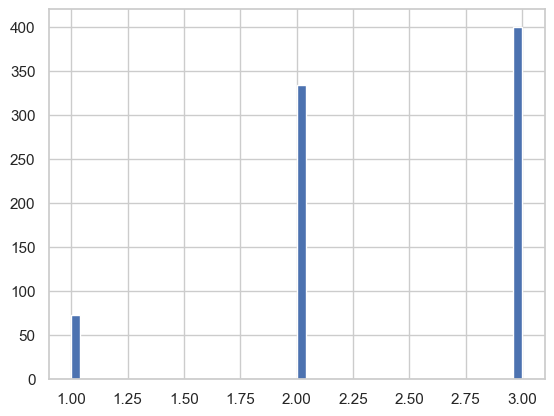

In [105]:
flags = power_trans_train_set.ram > 0.0
plt.hist(power_trans_train_set.price_range[flags], 50);

Number of outliers: 1034


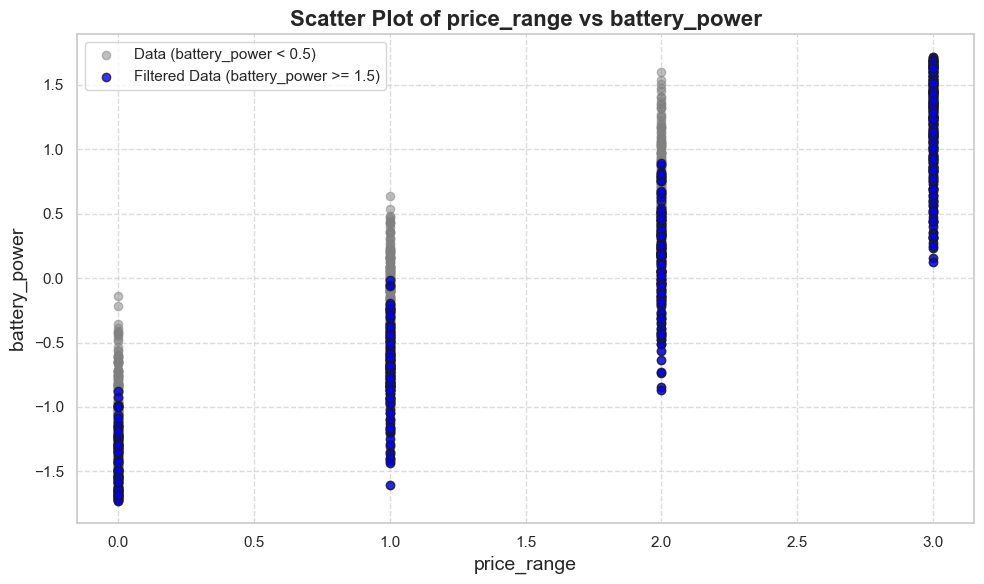

In [107]:
flags = power_trans_train_set.battery_power >= 0.5

plt.figure(figsize=(10,6))

plt.scatter(power_trans_train_set.price_range, power_trans_train_set.ram,
            color='gray', alpha=0.5, label='Data (battery_power < 0.5)')

plt.scatter(power_trans_train_set.price_range[flags], power_trans_train_set.ram[flags],
            color='blue', alpha=0.8, label='Filtered Data (battery_power >= 1.5)', edgecolors='k')

plt.title('Scatter Plot of price_range vs battery_power', fontsize=16, fontweight='bold')
plt.xlabel('price_range', fontsize=14)
plt.ylabel('battery_power    ', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()

print(f'Number of outliers: {(~flags).sum()}')

plt.show()


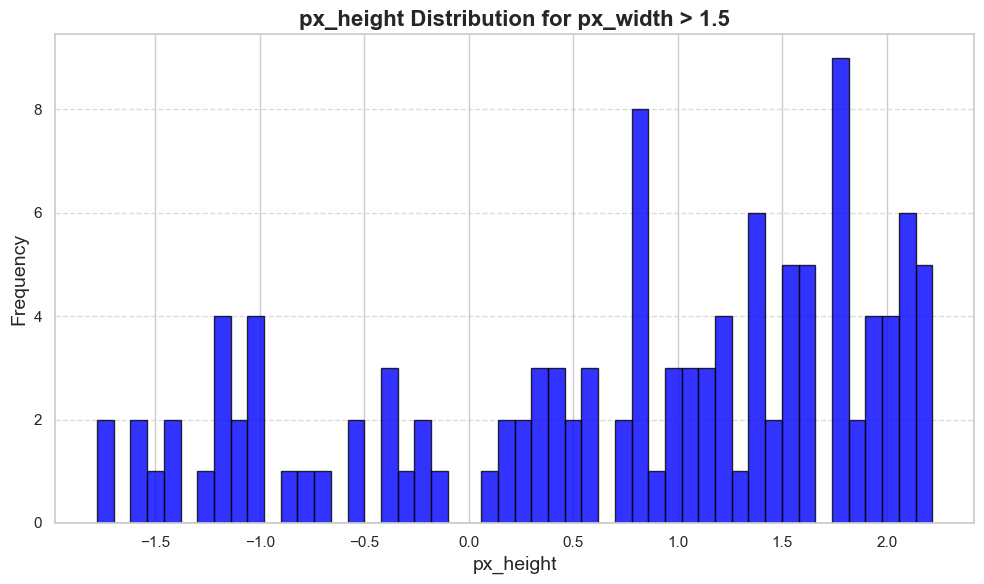

In [109]:
flags = power_trans_train_set.px_width > 1.5

plt.figure(figsize=(10,6))
plt.hist(power_trans_train_set.px_height[flags], bins=50, color='blue', edgecolor='black', alpha=0.8)

plt.title('px_height Distribution for px_width > 1.5', fontsize=16, fontweight='bold')
plt.xlabel('px_height', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

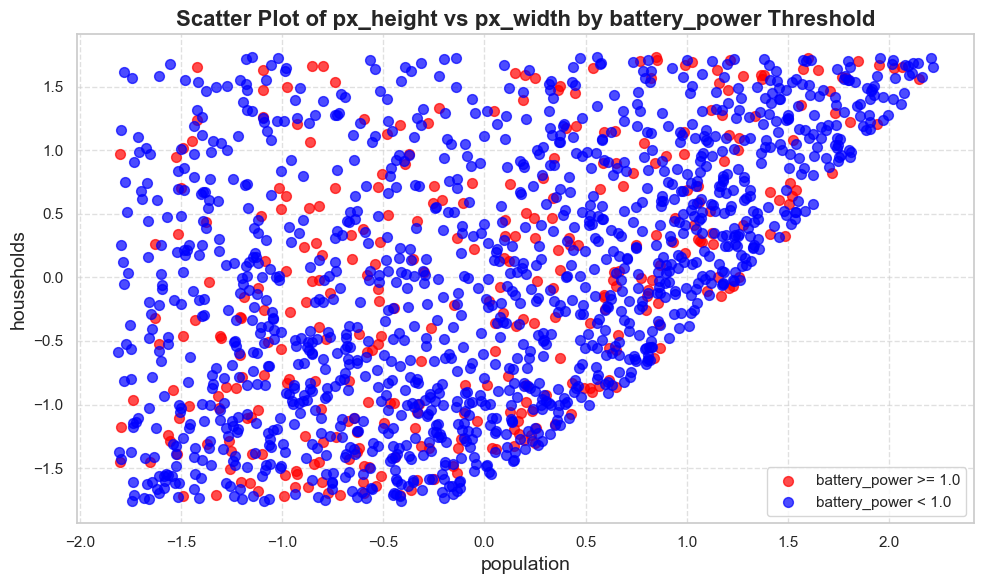

In [111]:
flags = power_trans_train_set.battery_power >= 1.0

plt.figure(figsize=(10,6))

plt.scatter(power_trans_train_set.px_height[flags], power_trans_train_set.px_width[flags],
            color='red', alpha=0.7, s=50, label='battery_power >= 1.0')

plt.scatter(power_trans_train_set.px_height[~flags], power_trans_train_set.px_width[~flags],
            color='blue', alpha=0.7, s=50, label='battery_power < 1.0')

plt.title('Scatter Plot of px_height vs px_width by battery_power Threshold', fontsize=16, fontweight='bold')
plt.xlabel('population', fontsize=14)
plt.ylabel('households', fontsize=14)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

plt.show()

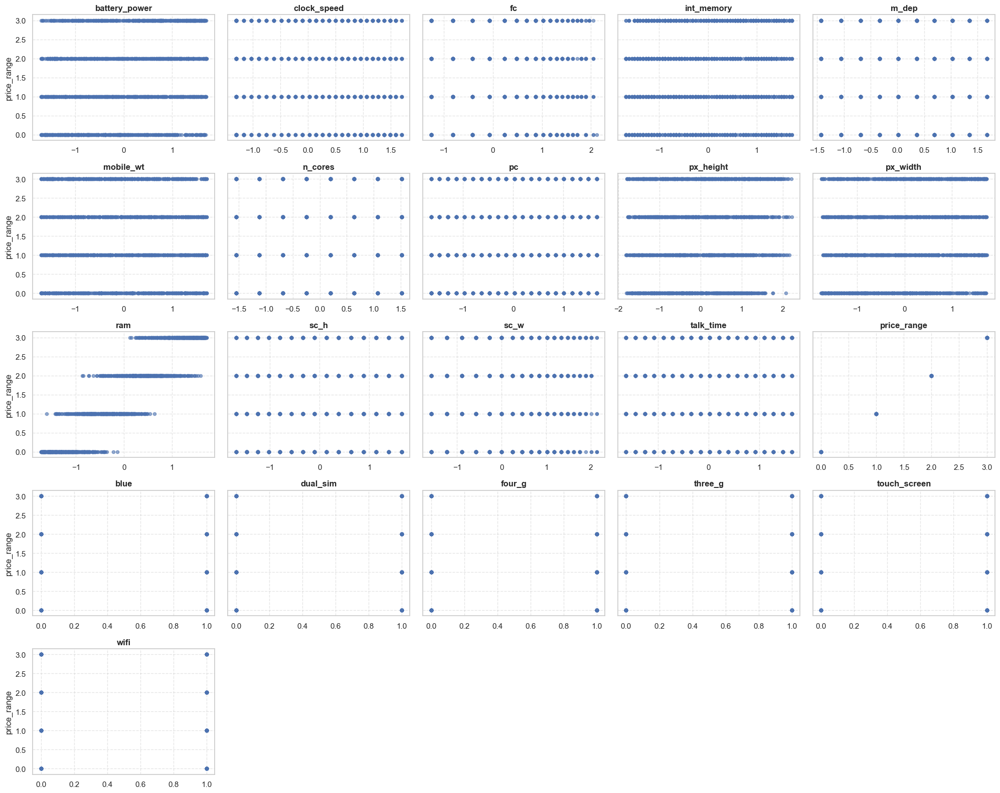

In [113]:
fig, axes = plt.subplots(5, 5, figsize=(20, 16))
axes_flat = axes.flatten()

for i, col in enumerate(power_trans_train_set.columns):
    ax = axes_flat[i]
    ax.scatter(power_trans_train_set[col], power_trans_train_set.price_range, alpha=0.6, s=20)
    ax.set_title(col, fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)

    if i % 5 != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel('price_range', fontsize=12)

for j in range(len(power_trans_train_set.columns), 25):
    axes_flat[j].axis('off')

plt.tight_layout()
plt.show()

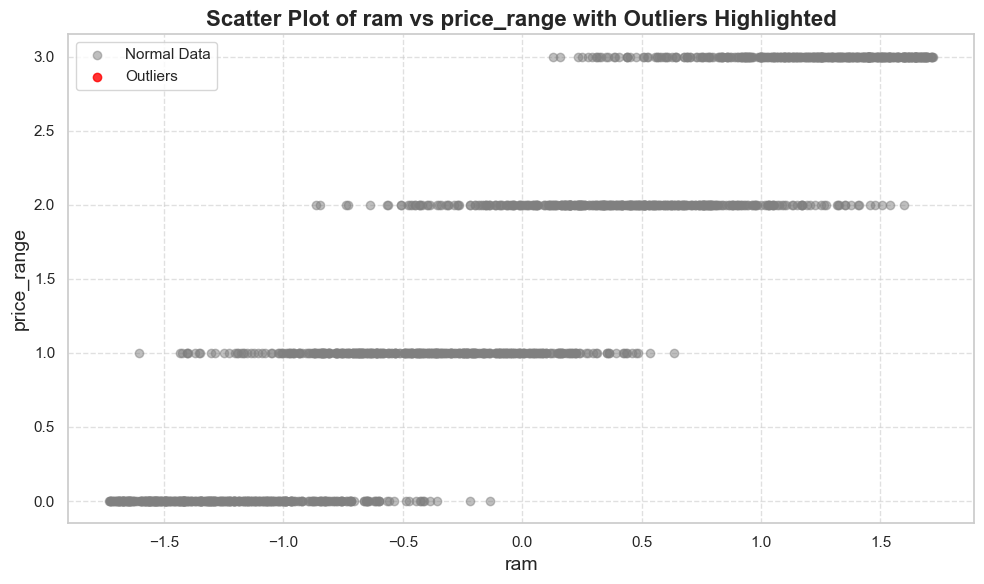

In [114]:
flags = (power_trans_train_set.fc > 2.1) & (power_trans_train_set.fc < -1.1)

plt.figure(figsize=(10,6))

plt.scatter(power_trans_train_set.ram[~flags], power_trans_train_set.price_range[~flags],
            color='gray', alpha=0.5, label='Normal Data')

plt.scatter(power_trans_train_set.ram[flags], power_trans_train_set.price_range[flags],
            color='red', alpha=0.8, label='Outliers')

plt.xlabel('ram', fontsize=14)
plt.ylabel('price_range', fontsize=14)
plt.title('Scatter Plot of ram vs price_range with Outliers Highlighted', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [117]:
corr = power_trans_train_set.corr()
corr[['price_range']].abs().sort_values(by='price_range')

,price_range
clock_speed,0.000314
n_cores,0.003781
four_g,0.003916
blue,0.005031
fc,0.011983
talk_time,0.012802
m_dep,0.013365
three_g,0.015093
wifi,0.016776
dual_sim,0.021804


In [16]:
columns_to_drop = [
    'clock_speed', 'n_cores', 'four_g', 'blue', 'fc', 'talk_time',
    'm_dep', 'three_g', 'wifi', 'dual_sim', 'sc_h', 'touch_screen',
    'sc_w', 'mobile_wt', 'pc', 'int_memory'
]

power_trans_train_set = power_trans_train_set.drop(columns=columns_to_drop)
power_trans_test_set = power_trans_test_set.drop(columns=columns_to_drop)

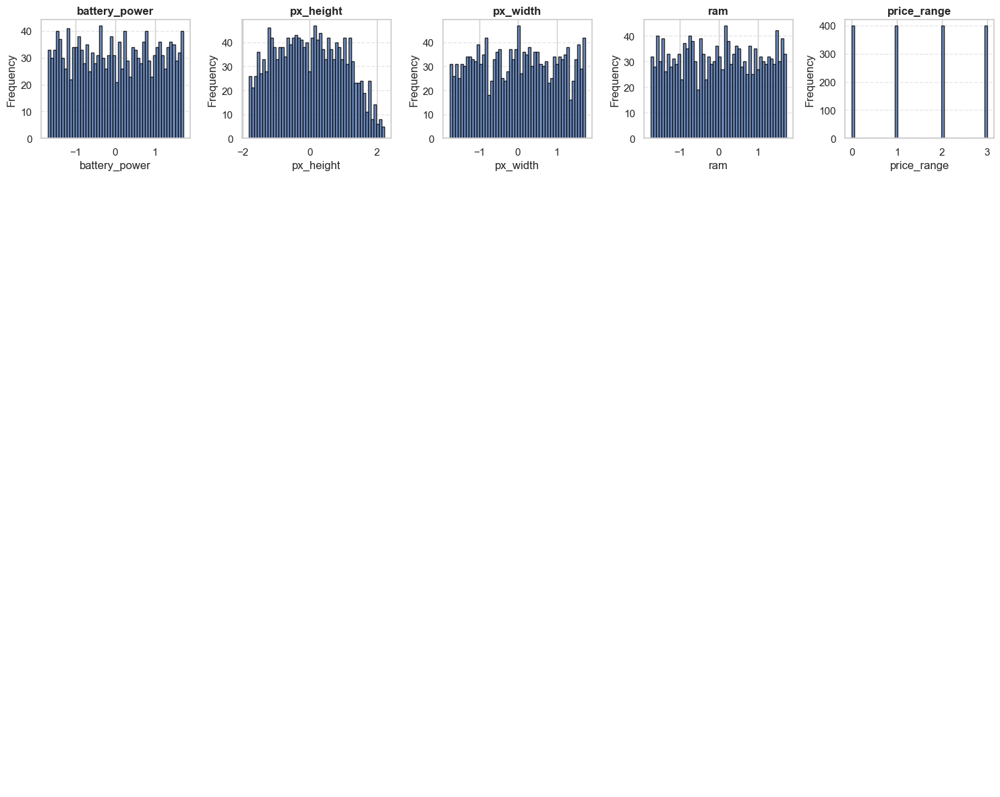

In [122]:
fig, axes = plt.subplots(5, 5, figsize=(15, 12))
axes_flat = axes.flatten()

# cols = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'mobile_wt', 
#         'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']

cols = power_trans_train_set.columns

for i, col in enumerate(cols):
    ax = axes_flat[i]
    ax.hist(power_trans_train_set[col], bins=50, color='b', edgecolor='black', alpha=0.8)
    ax.set_title(col, fontsize=12, fontweight='bold')
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

for j in range(len(cols), 25):
    axes_flat[j].axis('off')

plt.tight_layout()
plt.show()